In [1]:
!pip install pandas_profiling

In [2]:
!pip install pyramid-arima

In [3]:
!pip install pyramid

In [4]:
!pip install statsmodels

In [5]:
!pip install plotly

In [6]:
#Importing libraries
import numpy as np
import pandas as pd
import pandas_profiling as pf

#Required imports
import time, datetime

#Visualization imports
import matplotlib.pyplot as plt
%matplotlib inline
# Import plotly modules to view time series in a more interactive way
import plotly.graph_objects as go

import warnings
warnings. filterwarnings('ignore')

# preprocessing
from sklearn.preprocessing import LabelEncoder

from statsmodels.tsa.stattools import adfuller, acf, pacf
from statsmodels.tsa.arima_model import ARIMA
#from statsmodels.tsa.statespace import SARIMAX
from statsmodels.tsa.seasonal import seasonal_decompose
from sklearn.metrics import mean_squared_error

In [7]:
df_car = pd.read_csv('train_E1GspfA.csv', header=0)
df_car.head()

,date,hour,demand
0,2018-08-18,9,91
1,2018-08-18,10,21
2,2018-08-18,13,23
3,2018-08-18,14,104
4,2018-08-18,15,81


In [8]:
df_car.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18247 entries, 0 to 18246
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   date    18247 non-null  object
 1   hour    18247 non-null  int64 
 2   demand  18247 non-null  int64 
dtypes: int64(2), object(1)
memory usage: 427.8+ KB


In [9]:
df_car['joined_date']= df_car['date'].map(str)+ " " + df_car.hour.astype(str) + ":00:00"
df_car.head()

,date,hour,demand,joined_date
0,2018-08-18,9,91,2018-08-18 9:00:00
1,2018-08-18,10,21,2018-08-18 10:00:00
2,2018-08-18,13,23,2018-08-18 13:00:00
3,2018-08-18,14,104,2018-08-18 14:00:00
4,2018-08-18,15,81,2018-08-18 15:00:00


In [10]:
df_car.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18247 entries, 0 to 18246
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   date         18247 non-null  object
 1   hour         18247 non-null  int64 
 2   demand       18247 non-null  int64 
 3   joined_date  18247 non-null  object
dtypes: int64(2), object(2)
memory usage: 570.3+ KB


In [11]:
df_car.drop(['date','hour'], axis=1, inplace=True)

In [12]:
df_car.rename(columns = {'joined_date': 'date'}, inplace = True)
df_car.head()

,demand,date
0,91,2018-08-18 9:00:00
1,21,2018-08-18 10:00:00
2,23,2018-08-18 13:00:00
3,104,2018-08-18 14:00:00
4,81,2018-08-18 15:00:00


In [13]:
df_car.shape

(18247, 2)

In [14]:
#Checking missing values
df_car.isnull().sum()

demand    0
date      0
dtype: int64

In [15]:
# No null values

In [16]:
#Get the Descriptive Stats about the Numeric data along with the categorical feature
df_car.describe(include='all')

,demand,date
count,18247.000000,18247
unique,NaN,18247
top,NaN,2020-02-04 17:00:00
freq,NaN,1
mean,73.991451,NaN
std,41.678988,NaN
min,1.000000,NaN
25%,43.000000,NaN
50%,71.000000,NaN
75%,98.000000,NaN


In [17]:
# Finding Duplicate rows
duplicate_rows = df_car[df_car.duplicated(keep="first")]
duplicate_rows

,demand,date


In [18]:
df_car['date'] = pd.to_datetime(df_car['date'])

In [19]:
df_car.describe

<bound method NDFrame.describe of        demand                date
0          91 2018-08-18 09:00:00
1          21 2018-08-18 10:00:00
2          23 2018-08-18 13:00:00
3         104 2018-08-18 14:00:00
4          81 2018-08-18 15:00:00
...       ...                 ...
18242      95 2021-02-28 19:00:00
18243      88 2021-02-28 20:00:00
18244      39 2021-02-28 21:00:00
18245     104 2021-02-28 22:00:00
18246      85 2021-02-28 23:00:00

[18247 rows x 2 columns]>

In [20]:
df_car.set_index('date',inplace=True)
df_car

,demand
date,
2018-08-18 09:00:00,91
2018-08-18 10:00:00,21
2018-08-18 13:00:00,23
2018-08-18 14:00:00,104
2018-08-18 15:00:00,81
...,...
2021-02-28 19:00:00,95
2021-02-28 20:00:00,88
2021-02-28 21:00:00,39


In [21]:
df_car.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 18247 entries, 2018-08-18 09:00:00 to 2021-02-28 23:00:00
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype
---  ------  --------------  -----
 0   demand  18247 non-null  int64
dtypes: int64(1)
memory usage: 285.1 KB


df_car.index = pd.to_datetime(df_car['date'])
df_car.drop(columns='date',inplace=True)
df_car.head()

<AxesSubplot:xlabel='date'>

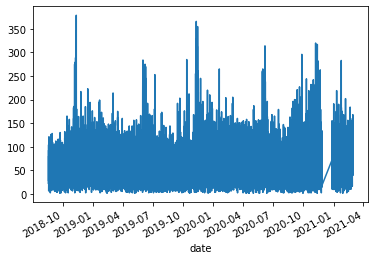

In [22]:
df_car.demand.plot()

In [23]:
#divide into train and validation set
df_car_train = df_car[:int(0.7*(len(df_car)))]
df_car_valid = df_car[int(0.7*(len(df_car))):]

#building the model
from pyramid.arima import auto_arima
model = auto_arima(df_car_train, trace=True, error_action='ignore', suppress_warnings=True)
model.fit(df_car_train)

forecast = model.predict(n_periods=len(df_car_valid))
forecast = pd.DataFrame(forecast,index = df_car_valid.index,columns=['Prediction'])

#plot the predictions for validation set
plt.plot(df_car_train, label='Train')
plt.plot(df_car_valid, label='Valid')
plt.plot(forecast, label='Prediction')
plt.show()

In [24]:
def plot_timeseries(ts, title = 'og', opacity = 1):
    """
    Plot plotly time series of any given timeseries ts
    """
    fig = go.Figure()

    fig.add_trace(go.Scatter(x = ts.index, y = ts.values, name = "observed",
                         line_color = 'lightslategrey', opacity = opacity))

    fig.update_layout(title_text = title,
                  xaxis_rangeslider_visible = True)
    fig.show()

In [25]:
# Plotting our original time series
plot_timeseries(df_car.demand, title = 'Original data set')

In [26]:
# Let's decompose the time series to identify its multiple components

In [27]:
from statsmodels.graphics import tsaplots

date
2018-08-18 09:00:00     68.765360
2018-08-18 10:00:00    116.762734
2018-08-18 13:00:00    -22.240690
2018-08-18 14:00:00     21.763191
2018-08-18 15:00:00    -46.232357
Name: seasonal, dtype: float64


<Figure size 1152x576 with 0 Axes>

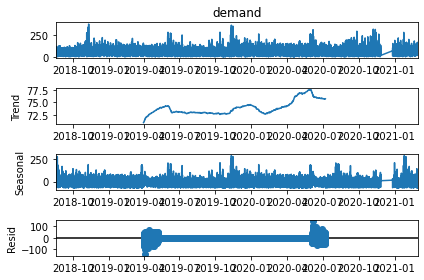

In [28]:
import statsmodels.api as sm
# Run seasonal decompose
decomp = sm.tsa.seasonal_decompose(df_car.demand, freq=24*365) # capturing the yearly seasonal component; i.e. for example 
print(decomp.seasonal.head()) # checking the seasonal component
plt.figure(figsize=(16,8))
plt.tight_layout()
_ = decomp.plot()

In [29]:
df_car['seasonal'] = decomp.seasonal

In [31]:
# Plotting the seasonal coponent only
plot_timeseries(df_car['seasonal'], title = 'Seasonal component')

In [32]:
df_car['trends'] = decomp.trend

In [33]:
# Plotting the seasonal coponent only
plot_timeseries(df_car['trends'], title = 'Trend component')

<AxesSubplot:xlabel='date'>

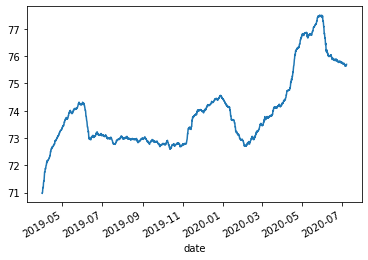

In [35]:
# Plotting the trend (the starting 6 months and the end 6 months of data is NaN because we had set the periodicity as 24*365,
#... so the trend data will have 8760 less values)
df_car['trends'].dropna().plot()

In [ ]:
# We can also check the trend using the pandas rolling method¶

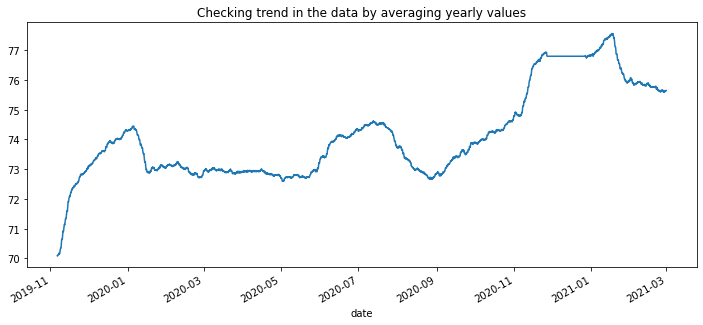

In [36]:
# Plotting the half yearly rolling average of the time series to check trend (mean consumption)

_ = df_car['demand'].rolling(window = 24*30*12).mean().plot(figsize=(12,5))
_ = plt.title('Checking trend in the data by averaging yearly values')

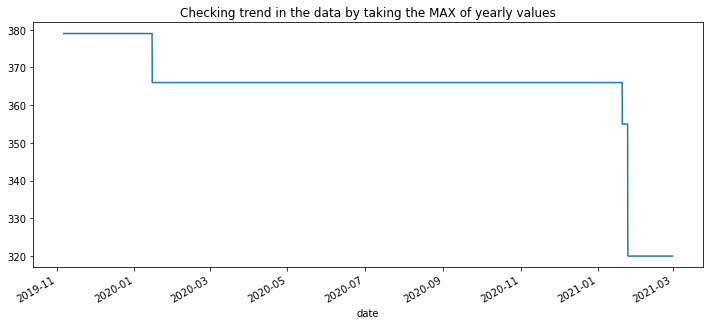

In [37]:
# Plotting the quartely rolling MAX of the time series to check trend
_ = df_car.demand.rolling(window = 24*30*12).max().plot(figsize=(12,5))
_ = plt.title('Checking trend in the data by taking the MAX of yearly values')

# We can observe a downward trend in the data as observed using the decompose method above

 Stationarity

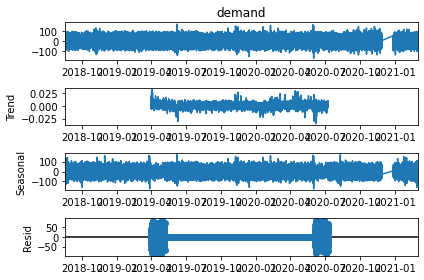

In [44]:
# Differencing the data once

decomp_diff1 = sm.tsa.seasonal_decompose(df_car.demand.diff().dropna(), freq=24*365) 
_ = decomp_diff1.plot()

In [ ]:
# Comparing the above differenced plot with the previous original data plot we can see how the trend was removed by differencing just once and also the effect of seasonality was also reduced.


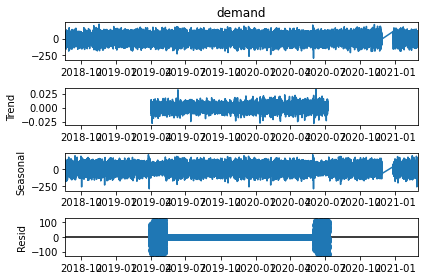

In [46]:
# Differencing the data with periodicity of 24 hours in addition to the original single differencing

decomp_diff24 = sm.tsa.seasonal_decompose(df_car.demand.diff().dropna().diff(24).dropna(), freq=24*365) 
_ = decomp_diff24.plot()

In [48]:
# Differencing the dataset once and then with the period of 24 hours further diminishes any trend and seasonality effects and seems to render the dataset stationary

Conducting the Dicky Fuller test of Stationarity

In [49]:
from statsmodels.tsa.stattools import adfuller

In [50]:
def run_adfuller(ts):
    result = adfuller(ts)
    # Print test statistic
    print("t-stat", result[0])
    # Print p-value
    print("p-value", result[1])
    # Print #lags used
    print("#lags used", result[2])
    # Print critical values
    print("critical values", result[4]) 

In [51]:
print("for no differencing\n")
run_adfuller(df_car.demand)
print("\nfor single differencing\n")
run_adfuller(df_car.demand.diff().dropna())
print("\nfor differenced data set over lags 24 after single differencing\n")
run_adfuller(df_car.demand.diff().dropna().diff(24).dropna())

for no differencing

t-stat -12.543616615314841
p-value 2.285775462202281e-23
#lags used 22
critical values {'1%': -3.430708879572664, '5%': -2.861698611306604, '10%': -2.566854424612456}

for single differencing

t-stat -54.485032230466466
p-value 0.0
#lags used 23
critical values {'1%': -3.430708918967917, '5%': -2.8616986287167756, '10%': -2.5668544338796138}

for differenced data set over lags 24 after single differencing

t-stat -38.14100298352106
p-value 0.0
#lags used 44
critical values {'1%': -3.4307098076533604, '5%': -2.861699021458597, '10%': -2.5668546429298535}


Based on the p-values of the above tests it seems that even our original dataset is stationary but if we check the t-stat values it is obvious that the stationarity gets more significant with differencing.

The original dataset was declared stationary by the test maybe because the trend in our data is very weak (as evident from the decomposed plot). So, we can either use the original dataset as it is with the time series models (as we have done for the linear regression models before), or to be more robust we can use the single differencing to remove the trend and fit our models on the detrended data.

In [ ]:
# Exponential Smoothing


In [57]:
def plot_ts_pred(og_ts, pred_ts, model_name=None, og_ts_opacity = 0.5, pred_ts_opacity = 0.5):
    """
    Plot plotly time series of the original (og_ts) and predicted (pred_ts) time series values to check how our model performs.
    model_name: name of the model used for predictions
    og_ts_opacity: opacity of the original time series
    pred_ts_opacity: opacity of the predicted time series
    """
    
    fig = go.Figure()

    fig.add_trace(go.Scatter(x = og_ts.index, y = np.array(og_ts.values), name = "Observed",
                         line_color = 'deepskyblue', opacity = og_ts_opacity))

    try:
        fig.add_trace(go.Scatter(x = pred_ts.index, y = pred_ts, name = model_name,
                         line_color = 'lightslategrey', opacity = pred_ts_opacity))
    except: #if predicted values are a numpy array they won't have an index
        fig.add_trace(go.Scatter(x = og_ts.index, y = pred_ts, name = model_name,
                         line_color = 'lightslategrey', opacity = pred_ts_opacity))


    #fig.add_trace(go)
    fig.update_layout(title_text = 'Observed test set vs predicted Demand values using {}'.format(model_name),
                  xaxis_rangeslider_visible = True)
    fig.show()

In [58]:
# Defining a function to plot exponentially smoothed data
def plot_ewma(ts, alpha):
    expw_ma = ts.ewm(alpha=alpha).mean()
    
    plot_ts_pred(ts, expw_ma, model_name='Exponentially smoothed data with alpha = {}'.format(alpha), \
                 og_ts_opacity = 0.5, pred_ts_opacity = 0.5)

In [60]:
# Plotting the exponentially smoothed Demand data with alpha=0.3
plot_ewma(df_car.demand, 0.3)

In [65]:
# Plotting the exponentially smoothed Demand data with alpha=0.3
plot_ewma(df_car.demand, 0.4)

The EWMA does a good job of modeling the future values but it requires N number of lag variables depending on the value of alpha and also it's a very simplistic model for our energy consumption data.

Correlation with the past values
The correlation of the time series observations calculated with values of the same series at previous times, is called a serial correlation, or an autocorrelation (ACF). It is used to determine the moving average (MA or q) term of the ARIMA(p,d,q) models.

In [66]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

In [67]:
def acf_pacf_plots(ts, lags, figsize = (12,8)):
    
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize = figsize)
    
    # Plot the ACF of ts
    _ = plot_acf(ts, lags = lags, zero = False, ax = ax1, alpha = 0.05)

    # Plot the PACF of ts
    _ = plot_pacf(ts, lags = lags, zero = False, ax = ax2, alpha = 0.05)

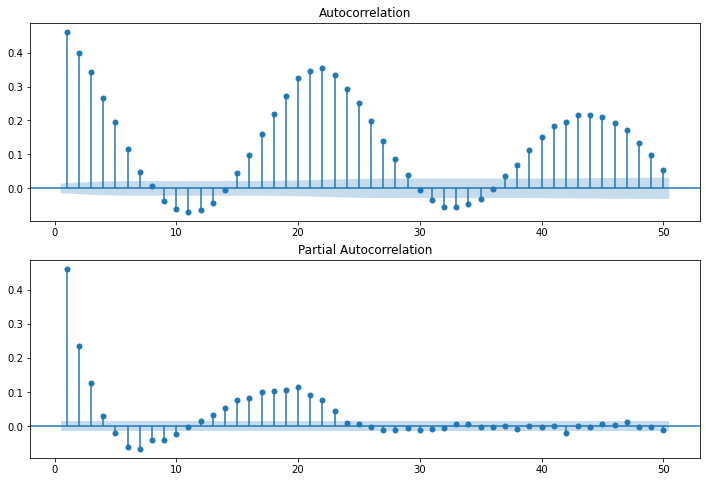

In [68]:
# Create the acf and pacf plots

dfacf = []
dfacf = df_car.demand
lags = 50

acf_pacf_plots(dfacf, lags = lags, figsize = (12,8))

The seasonal period of 24 hours can be easily observed from the plots above.

In [ ]:
# Differencing the data this time to remove the trend and seasonality
dfacf = []
dfacf = ts_sdge['SDGE']
dfacf = dfacf.diff().dropna() 
dfacf = dfacf.diff(24).dropna()
dfacf = dfacf.diff(24*365).dropna()
lags = 100

acf_pacf_plots(dfacf, lags = lags, figsize = (12,8))